## Cleaned group notebook
#### Transit desert group  
Our group tries to analyze the discrepancy between public transit needs and current public transit provisions in LA. This notebook contains important charts, maps and other coding material relevant for our final project.

#### Installing and importing required libraries

In [ ]:
pip install folium

In [ ]:
pip install matplotlib

In [ ]:
pip install mapclassify

In [ ]:
pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 kB 2.9 MB/s eta 0:00:00


In [ ]:
pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 48.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
import folium
import gdown
import numpy as np
import mapclassify

# for network analysis
import networkx as nx

# for street network analysis
import osmnx as ox

# for basemaps
import contextily as ctx

# to draw custom legend elements, import these libraries
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize
from shapely.geometry import Point

#### Managing structural data

#### Importing "age" data

In [ ]:
#load a data file and changing data type of FIPS into strings for leading zeros
df = pd.read_csv('https://drive.google.com/uc?id=1es12yHg1oARRFLY9sKXRKEQKGt6nSq5O', dtype={'FIPS': str})

<ipython-input-7-eb04bb542a80>:2: DtypeWarning: Columns (294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,320,321,322) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('https://drive.google.com/uc?id=1es12yHg1oARRFLY9sKXRKEQKGt6nSq5O', dtype={'FIPS': str})


In [ ]:
#creating new dataframe including data to be used
columns_to_keep = ['FIPS',
                   'DP1_0024C',
                   'DP1_0024P',
                   ]
df2 = df[columns_to_keep]

In [ ]:
#change the column names to common language
df2.columns = ['FIPS',
'Population Over 65',
'Percent_of_Population_Over_65',
]
df2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2488 entries, 0 to 2487
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   FIPS                           2488 non-null   object 
 1   Population Over 65             2488 non-null   int64  
 2   Percent_of_Population_Over_65  2488 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 58.4+ KB


#### Importing public transit commuter data

In [ ]:
#load another data file and changing data type of FIPS into strings for leading zeros
df3 = pd.read_csv('https://drive.google.com/uc?id=1tGdLFSOzu_5MLQ5rEpKwMJtX86NJsxsm', dtype={'FIPS': str})

<ipython-input-10-d969cc76f9bf>:2: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,197,199,201,211,212,217,218,223,224,229,230,235,236,241,242,247,248,253,254,259,260,265,266,271,272,277,278,283,284,289,290,295,296,301,302,307,308,313,314,319,320,325,326,331,332,337,338,343,344,349,350,355,356,361,362,373,374,379,380,385,386,391,392,397,398,403,404,409,410,415,416,457,458,463,464,469,470,475,476,481,482,487,488,493,494,499,500,505,506,511,512,517,518,523,524,529,530,

In [ ]:
#creating new dataframe including data to be used
columns_to_keep2 = ['FIPS',
                   'S0802_C04_098E',]
df4 = df3[columns_to_keep2]

In [ ]:
#change the column names to common language
df4.columns = ['FIPS',
'Percentage_of_Public_Transportation',]
df4.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 2 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   FIPS                                 2346 non-null   object 
 1   Percentage_of_Public_Transportation  2346 non-null   float64
dtypes: float64(1), object(1)
memory usage: 36.8+ KB


#### Importing car ownership data

In [ ]:
#importing data of percentage without vehicle
tracts2 = gpd.read_file('https://drive.google.com/uc?id=1kQbA-Htik2LE6c9S6ewg_lgiAY2awe7x')
tracts2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   tract                2495 non-null   object  
 1   no_vehicle           2495 non-null   int64   
 2   no_vehicle_universe  2495 non-null   int64   
 3   no_vehicle_pct       2471 non-null   float64 
 4   sup_dist             2495 non-null   object  
 5   csa                  2495 non-null   object  
 6   spa                  2495 non-null   object  
 7   ESRI_OID             2495 non-null   int64   
 8   Shape__Area          2495 non-null   float64 
 9   Shape__Length        2495 non-null   float64 
 10  geometry             2495 non-null   geometry
dtypes: float64(3), geometry(1), int64(3), object(4)
memory usage: 214.5+ KB


In [ ]:
columns2 = list(tracts2)
columns2

['tract',
 'no_vehicle',
 'no_vehicle_universe',
 'no_vehicle_pct',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [ ]:
tracts2.columns = ['FIPS',
 'no_vehicle',
 'no_vehicle_universe',
 'Percentage_of_Without_Vehicle',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [ ]:
#creating new dataframe including data to be used
columns_to_keep3 = ['FIPS',
                   'Percentage_of_Without_Vehicle',
                   'geometry']
tracts3 = tracts2[columns_to_keep3]

#### Importing income data

In [ ]:
gdown.download('https://drive.google.com/uc?id=1kvPCCTs3CjzpbUDHQyrKgBWpsdb9CztX', 'Median_Income_and_AMI_(census_tract).geojson', quiet=False)
incomedf = gpd.read_file('Median_Income_and_AMI_(census_tract).geojson')
print(incomedf.head())

Downloading...
From: https://drive.google.com/uc?id=1kvPCCTs3CjzpbUDHQyrKgBWpsdb9CztX
To: /content/Median_Income_and_AMI_(census_tract).geojson
100%|██████████| 3.32M/3.32M [00:00<00:00, 67.2MB/s]


         tract  med_hh_income  med_hh_income_universe     ami_category  \
0  06037199700        38892.0                    1204  Very Low Income   
1  06037199801        41027.0                     903  Very Low Income   
2  06037199802        42500.0                     612  Very Low Income   
3  06037199900        37232.0                     845  Very Low Income   
4  06037201110        65000.0                     782       Low Income   

  below_med_income below_60pct_med_income below_moderate_income    sup_dist  \
0              Yes                    Yes                   Yes  District 1   
1              Yes                    Yes                   Yes  District 1   
2              Yes                    Yes                   Yes  District 1   
3              Yes                    Yes                   Yes  District 1   
4              Yes                     No                   Yes  District 1   

                                csa            spa  ESRI_OID   Shape__Area  \
0 

<Axes: ylabel='Frequency'>

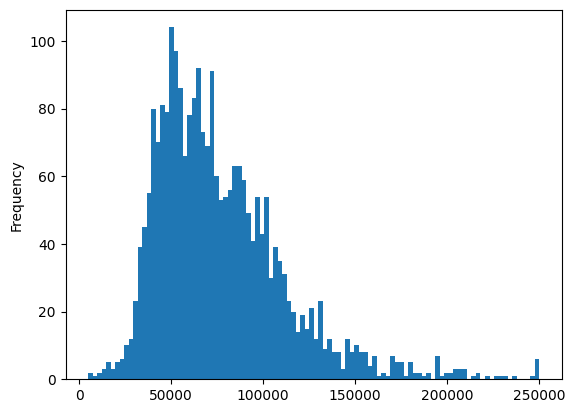

In [ ]:
#relevant chart
incomedf['med_hh_income'].plot.hist(bins=100)

#### creating new dataframe merged variables of interests

In [ ]:
#merging dataframe and geodataframe of census tracts
tracts_combined=tracts3.merge(df2,on="FIPS")
tracts_combined.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2488 entries, 0 to 2487
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   FIPS                           2488 non-null   object  
 1   Percentage_of_Without_Vehicle  2471 non-null   float64 
 2   geometry                       2488 non-null   geometry
 3   Population Over 65             2488 non-null   int64   
 4   Percent_of_Population_Over_65  2488 non-null   float64 
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 116.6+ KB


In [ ]:
#merging another dataframe and geodataframe of census tracts
tracts_combined2=tracts_combined.merge(df4,on="FIPS")
tracts_combined2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2015 entries, 0 to 2014
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 2015 non-null   object  
 1   Percentage_of_Without_Vehicle        2000 non-null   float64 
 2   geometry                             2015 non-null   geometry
 3   Population Over 65                   2015 non-null   int64   
 4   Percent_of_Population_Over_65        2015 non-null   float64 
 5   Percentage_of_Public_Transportation  2015 non-null   float64 
dtypes: float64(3), geometry(1), int64(1), object(1)
memory usage: 110.2+ KB


In [ ]:
incomedf['FIPS'] = incomedf ['tract']
#merging another dataframe and geodataframe of census tracts
tracts_combined3=tracts_combined2.merge(incomedf,on="FIPS")
tracts_combined3.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2015 entries, 0 to 2014
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 2015 non-null   object  
 1   Percentage_of_Without_Vehicle        2000 non-null   float64 
 2   geometry_x                           2015 non-null   geometry
 3   Population Over 65                   2015 non-null   int64   
 4   Percent_of_Population_Over_65        2015 non-null   float64 
 5   Percentage_of_Public_Transportation  2015 non-null   float64 
 6   tract                                2015 non-null   object  
 7   med_hh_income                        1991 non-null   float64 
 8   med_hh_income_universe               2015 non-null   int64   
 9   ami_category                         1991 non-null   object  
 10  below_med_income                     1991 non-null   object  
 11  below_60pct_med_i

### Maps and charts !

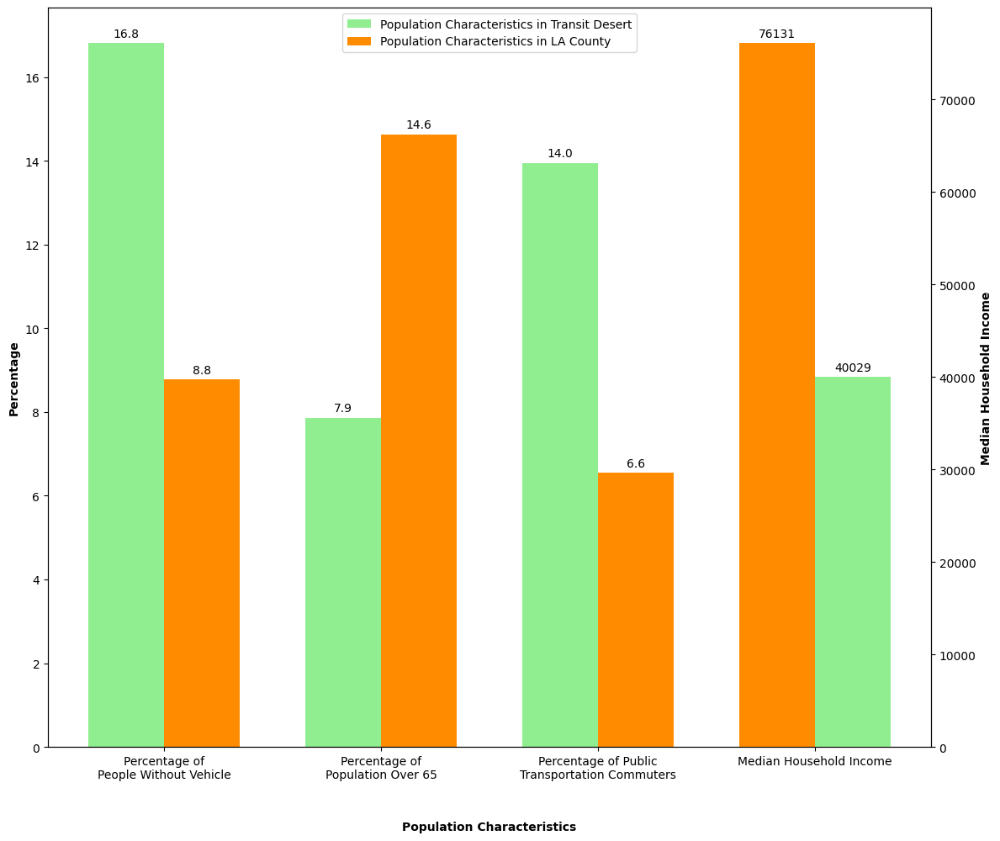

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

data1 = [
    'Percentage_of_Without_Vehicle',
    'Percent_of_Population_Over_65',
    'Percentage_of_Public_Transportation',
    'med_hh_income'
]

name1 = [
    'Percentage of\nPeople Without Vehicle',
    'Percentage of\nPopulation Over 65',
    'Percentage of Public\nTransportation Commuters',
    'Median Household Income'
]

desert_data1_means = desert_combined[data1].mean()
data1_means = tracts_combined3[data1].mean()

mean_df = pd.DataFrame({'data': data1_means, 'data1_desert': desert_data1_means})
n_groups = len(data1)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax1 = plt.subplots(figsize=(12, 10))

# Plotting the green bars on the left
bar2 = ax1.bar(index[:-1], desert_data1_means[:-1], bar_width, label='Population Characteristics in Transit Desert', color='lightgreen')
# Plotting the orange bars on the right
bar1 = ax1.bar(index[:-1] + bar_width, data1_means[:-1], bar_width, label='Population Characteristics in LA County', color='darkorange')

ax1.set_xlabel('Population Characteristics', weight='bold')  # Set x-axis title in bold
ax1.set_ylabel('Percentage', weight='bold')
ax1.set_xticks(index[:-1] + bar_width / 2)
ax1.set_xticklabels(name1[:-1], rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
ax1.legend()

for bar in bar1 + bar2:
    height = bar.get_height()
    ax1.annotate(f'{height:.1f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),  # 3 points vertical offset
                 textcoords="offset points",
                 ha='center', va='bottom')

ax2 = ax1.twinx()
color = 'purple'

bar3 = ax2.bar(index[-1], data1_means[-1], bar_width, color='darkorange')
bar4 = ax2.bar(index[-1] + bar_width, desert_data1_means[-1], bar_width, color='lightgreen')

for bar in bar3.patches + bar4.patches:
    height = bar.get_height()
    ax2.annotate(f'{height:.0f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),  # 3 points vertical offset
                 textcoords="offset points",
                 ha='center', va='bottom')

ax2.set_ylabel('Median Household Income', weight='bold')  # Set y-axis title in bold
ax1.set_xticks(index+bar_width/2)
ax1.set_xticklabels(name1, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels

ax1.legend(loc='upper center')

# Adjust x-axis label position
ax1.xaxis.set_label_coords(0.5, -0.1)

fig.tight_layout()
plt.show()


In [ ]:
data2 = [
    'below_60pct_med_income',
    'below_med_income',
    'below_moderate_income'
]

counts = tracts_combined3[data2].apply(lambda x: (x == 'Yes').sum())
counts_desert = desert_combined[data2].apply(lambda x: (x == 'Yes').sum())

percentages = counts / len(tracts_combined3) * 100
percentages_desert = counts_desert / len(desert_combined) * 100

print("Counts:\n", counts_desert)
print("\nPercentages:\n", percentages_desert)


Counts:
 below_60pct_med_income    34
below_med_income          40
below_moderate_income     40
dtype: int64

Percentages:
 below_60pct_med_income     85.0
below_med_income          100.0
below_moderate_income     100.0
dtype: float64


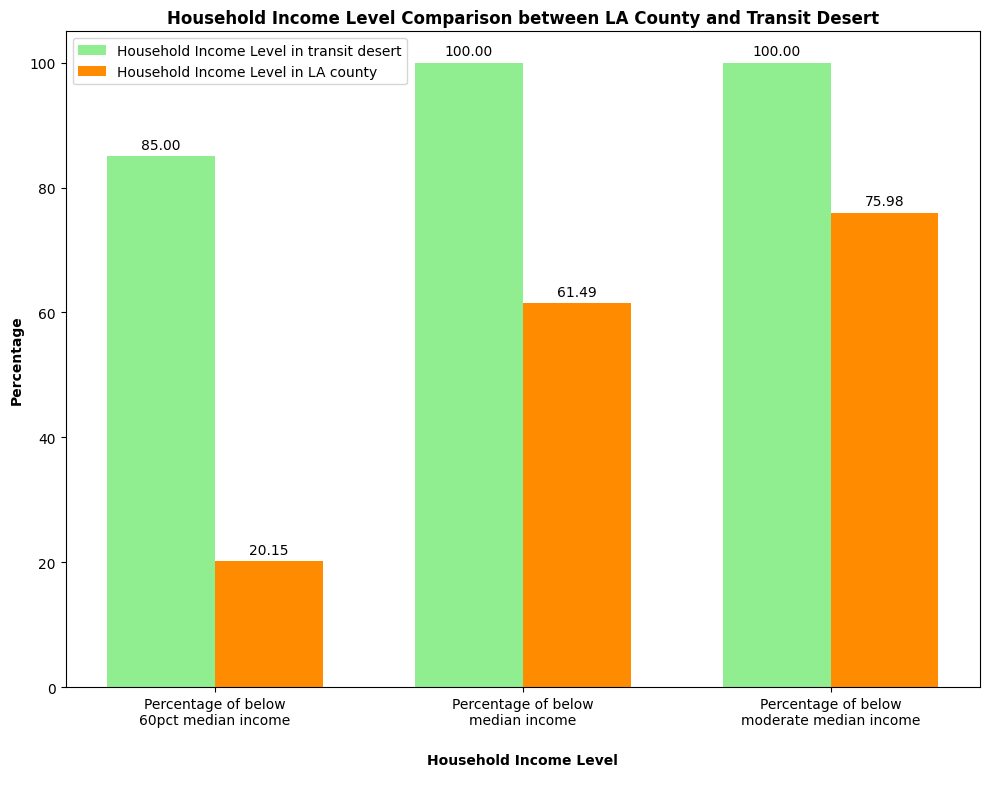

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

name2 = [
    'Percentage of below\n60pct median income',
    'Percentage of below\nmedian income',
    'Percentage of below\nmoderate median income'
]

# Create a DataFrame from the means
n_groups = len(data2)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax = plt.subplots(figsize=(10, 8))

# Plotting the green bars on the left
bar2 = plt.bar(index, percentages_desert, bar_width, label='Household Income Level in transit desert', color='lightgreen')
# Plotting the orange bars on the right
bar1 = plt.bar(index + bar_width, percentages, bar_width, label='Household Income Level in LA county', color='darkorange')

# Adding value annotations above each bar
for bar in bar1 + bar2:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.xlabel('Household Income Level\n', weight='bold')  # Set x-axis label in bold with a space at the end
plt.ylabel('Percentage', weight='bold')
plt.title('Household Income Level Comparison between LA County and Transit Desert', weight='bold')
plt.xticks(index + bar_width / 2, name2, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
plt.legend()

# Adjust the position of the x-axis label to add space between the label and the axis
ax.xaxis.set_label_coords(0.5, -0.1)

plt.tight_layout()
plt.show()


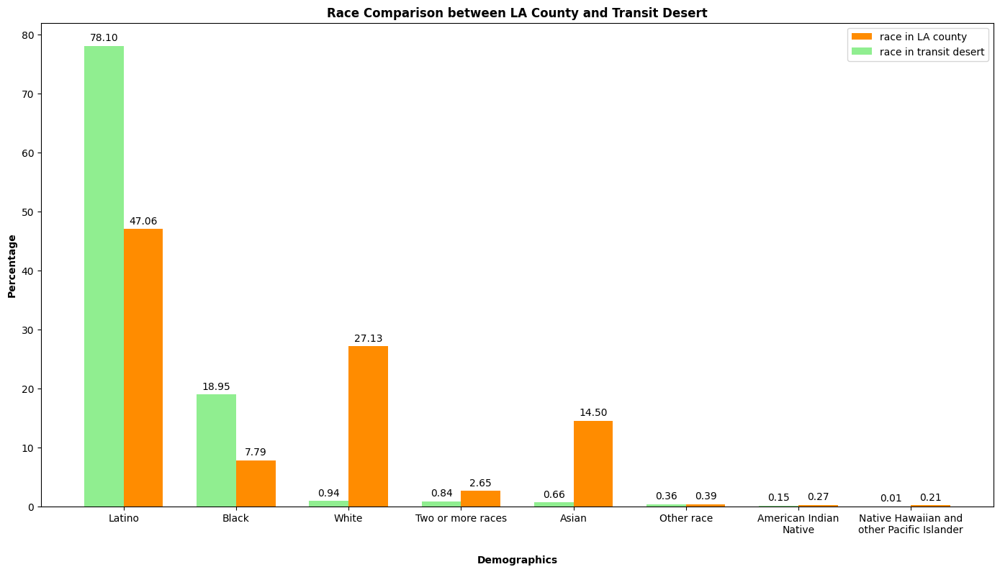

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

race_desert_df = pd.read_csv('https://drive.google.com/uc?export=download&id=16w6gciQknWRL5L74TNX63kb0YeIFoFXO', dtype={'FIPS': str})
race_df = pd.read_csv('https://drive.google.com/uc?export=download&id=17vxvt5SN_YkKLabyKESNAZI2qBLu8Az9', dtype={'FIPS': str})

columns = [
    'american_indian_native_pct',
    'asian_pct',
    'black_pct',
    'latino_pct',
    'native_hawaiian_other_pct',
    'other_race_pct',
    'pop_two_or_more_pct',
    'white_pct'
]

column = [
    'American Indian\nNative',
    'Asian',
    'Black',
    'Latino',
    'Native Hawaiian and\nother Pacific Islander',
    'Other race',
    'Two or more races',
    'White'
]

race_means = race_df[columns].mean()
race_desert_means = race_desert_df[columns].mean()

# Sort the mean values and corresponding labels by the green bars (race in transit desert)
sorted_means = sorted(zip(race_means, race_desert_means, column), key=lambda x: x[1], reverse=True)
sorted_race_means = [mean[0] for mean in sorted_means]
sorted_race_desert_means = [mean[1] for mean in sorted_means]
sorted_column = [mean[2] for mean in sorted_means]

# Create a DataFrame from the means
mean_df = pd.DataFrame({'race': sorted_race_means, 'race_desert': sorted_race_desert_means})
n_groups = len(columns)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax = plt.subplots(figsize=(14, 8))

bar1 = plt.bar(index + bar_width, sorted_race_means, bar_width, label='race in LA county', color='darkorange')
bar2 = plt.bar(index, sorted_race_desert_means, bar_width, label='race in transit desert', color='lightgreen')

# Adding value annotations above each bar
for bar in bar1 + bar2:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.xlabel('Demographics', weight='bold')  # Set x-axis label in bold
plt.ylabel('Percentage', weight='bold')  # Set y-axis label in bold
plt.title('Race Comparison between LA County and Transit Desert', weight='bold')
plt.xticks(index + bar_width / 2, sorted_column, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
plt.legend()

# Adjust the position of the x-axis label to add space between the label and the axis
ax.xaxis.set_label_coords(0.5, -0.1)

plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px

fig = px.scatter(tracts_combined2, x='Percentage_of_Without_Vehicle', y='Percentage_of_Public_Transportation', trendline="ols",
                 trendline_color_override='#a73838')

fig.update_traces(marker=dict(color='#006b6b'), selector=dict(mode='markers'))

fig.update_layout(
    plot_bgcolor='rgba(95,185,90,0.15)',
    autosize=False,
    width=600,
    height=600,
    xaxis=dict(
        title='Percentage of Population Without Vehicle',
        scaleanchor="y",
        scaleratio=1
    ),
    yaxis=dict(title='Percentage of Public Transportation Commuters')
)

fig.show()

results = px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()


                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                     2054.
Date:                Mon, 18 Mar 2024   Prob (F-statistic):          3.82e-309
Time:                        21:34:54   Log-Likelihood:                -6153.3
No. Observations:                2000   AIC:                         1.231e+04
Df Residuals:                    1998   BIC:                         1.232e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0181      0.170      5.984      0.000       0.684       1.352
x1             0.6356      0.014     45.326      0.000       0.608       0.663
==============================================================================
Omnibus:                      343.713   Durbin-Watson:                   1.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1591.960
Skew:                           0.745   Prob(JB):                         0.00
Kurtosis:                       7.109   Cond. No.                         17.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
import plotly.express as px

tracts_combined3['med_hh_income(k)'] = tracts_combined3['med_hh_income'] / 1000

fig = px.scatter(tracts_combined3, x='med_hh_income(k)', y='Percentage_of_Public_Transportation', log_x=True, trendline="ols", trendline_options=dict(log_x=True),
                 trendline_color_override='#a73838', title="Log-scaled Median Household Income (k) and log-transformed fit")

fig.update_traces(marker=dict(color='#f89739'), selector=dict(mode='markers'))

fig.update_layout(
    plot_bgcolor='rgba(248,151,57,0.15)',
    autosize=False,
    width=600,
    height=600,
    xaxis=dict(
        title='Median Household Income (Thousands of Dollars)',
        scaleanchor="y",
        scaleratio=1
    ),
    yaxis=dict(title='Percentage of Public Transportation')
)

fig.show()

results = px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()


                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.328
Model:                            OLS   Adj. R-squared:                  0.327
Method:                 Least Squares   F-statistic:                     969.4
Date:                Mon, 18 Mar 2024   Prob (F-statistic):          1.03e-173
Time:                        21:34:54   Log-Likelihood:                -6436.2
No. Observations:                1991   AIC:                         1.288e+04
Df Residuals:                    1989   BIC:                         1.289e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         48.4187      1.350     35.877      0.000      45.772      51.065
x1           -22.7171      0.730    -31.136      0.000     -24.148     -21.286
==============================================================================
Omnibus:                     1146.386   Durbin-Watson:                   1.708
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14733.676
Skew:                           2.461   Prob(JB):                         0.00
Kurtosis:                      15.385   Cond. No.                         23.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

####plotting metro station and creating .5 mile buffers around each station

In [ ]:
# importing data of metro stations locations
gdown.download('https://drive.google.com/uc?id=1cRzwLUgdbePXJpJ79HcrIamzcRhCbns0', 'All_MetroRail_Stations.zip', quiet=False)
metro = gpd.read_file('All_MetroRail_Stations.zip')
metro=metro.to_crs('EPSG:3857')

Downloading...
From: https://drive.google.com/uc?id=1cRzwLUgdbePXJpJ79HcrIamzcRhCbns0
To: /content/All_MetroRail_Stations.zip
100%|██████████| 6.88k/6.88k [00:00<00:00, 14.5MB/s]


<Axes: >

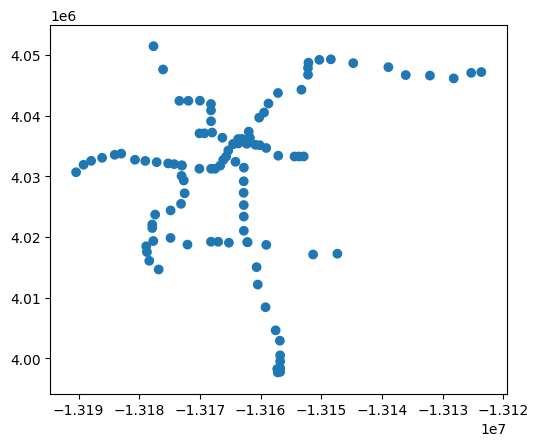

In [ ]:
buffer_distance = 804
buffered_points = metro.geometry.buffer(buffer_distance)

buffered_points_gdf = gpd.GeoDataFrame(geometry=buffered_points)
buffered_points_gdf.plot()

####mapping the car ownership overlaying with metro stations

In [ ]:
# Create a map of LA County with 'CartoDB positron' as the default basemap
la_county_bounds = [[33.703652, -118.468176], [34.337306, -117.955289]]
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Plot census tracts and metro stations
tracts_combined.explore(
    m=m,
    column="Percentage_of_Without_Vehicle",
    scheme="NaturalBreaks",
    k=10,
    cmap="Oranges",
    legend=True,
    tooltip=False,
    popup=["Percentage_of_Without_Vehicle"],
    name="Percentage of Without Vehicle",
    style_kwds=dict(stroke=False)
)

buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=10, fill=True, fillColor="#5fb95a"),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file, plot map
m.save('Percentage_of_Without_Vehicle.html')
m

#### mapping the public transit commuters overlaying with metro stations

In [ ]:
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Visualize the percentage of public transportation commuters
tracts_combined2.explore(
    m=m,
    column="Percentage_of_Public_Transportation",
    scheme="quantiles",
    legend=True,
    k=10,
    cmap="Greens",
    tooltip=False,
    popup=["Percentage_of_Public_Transportation"],
    name="Percentage of Public Transportation",
    style_kwds=dict(stroke=False)
)

# Plot buffered points for metro stations, using green color and specified marker options
buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=5, fill=True),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file, plot map
m.save('Percentage_of_Public_Transportation.html')
m

#### mapping income

In [ ]:
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Visualize median household income
incomedf.explore(
    m=m,
    column="med_hh_income",
    scheme="quantiles",
    legend=True,
    k=10,
    cmap="RdGy",
    tooltip=False,
    popup=["med_hh_income"],
    name="Median Household Income",
    style_kwds=dict(stroke=False)
)

# Plot buffered points for metro stations
buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=5, fill=True),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map
m.save('Median_Household_Income.html')
m

#### Group Members
- Alain Jabbour: analyzing househould incomes  
- Simon Han: analyzing car ownership  
- Tomohiro Ujikawa: managing assignments submission and analyzing older population, transit commuter and car ownership  
- Xinyi Cao: analyzing gross rent changes and using regression analysis